<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Lab 7.2.1: Bagging

INSTRUCTIONS:

- Read the guides and hints then create the necessary analysis and code to find an answer and conclusion for the scenario below.
- The baseline results (minimum) are:
    - **Accuracy** = 0.9667
    - **ROC AUC**  = 0.9614
- Try to achieve better results!

# Foreword
It is common that companies and professionals start with the data immediately available. Although this approach works, ideally the first step is to identify the problem or question and only then identify and obtain the set of data that can help to solve or answer the problem.

Also, given the current abundance of data, processing power and some particular machine learning methods, there could be a temptation to use ALL the data available. **Quality** is _**better**_ than **Quantity**!

Part of calling this discipline **Data Science** is that it is supposed to follow a process and not reach conclusions without support from evidence.

Moreover, it is a creative, exploratory, laborious and iterative process. It is part of the process to repeat, review and change when finding a dead-end.

## Scenario: Predicting Breast Cancer
The dataset you are going to be using for this laboratory is popularly known as the **Wisconsin Breast Cancer** dataset (`breast-cancer-wisconsin-data-old.csv`). The task related to it is Classification.

The dataset contains a total number of _10_ features labelled in either **benign** or **malignant** classes. The features have _699_ instances out of which _16_ feature values are missing. The dataset only contains numeric values.

# Step 1: Define the problem or question
Identify the subject matter and the given or obvious questions that would be relevant in the field.

## Potential Questions
List the given or obvious questions.

Answer:  

Subject Matter - Breast Cancer Classification Problem  
Question - Will someone be diagnosed with benign or malignant cancer?

# Step 2: Find the Data
### Wisconsin Breast Cancer DataSet
- **Citation Request**

    This breast cancer databases was obtained from the **University of Wisconsin Hospitals**, **Madison** from **Dr. William H. Wolberg**. If you publish results when using this database, then please include this information in your acknowledgements.

- **Title**

    Wisconsin Breast Cancer Database (January 8, 1991)

- **Sources**
    - **Creator**
            Dr. William H. Wolberg (physician)
            University of Wisconsin Hospitals
            Madison, Wisconsin
            USA
    - **Donor**
            Olvi Mangasarian (mangasarian@cs.wisc.edu)
            Received by David W. Aha (aha@cs.jhu.edu)
    - **Date**
            15 July 1992
        
### UCI - Machine Learning Repository
- Center for Machine Learning and Intelligent Systems

The [**UCI Machine Learning Repository**](http://archive.ics.uci.edu/about) is a collection of databases, domain theories, and data generators that are used by the machine learning community for the empirical analysis of machine learning algorithms.

https://archive.ics.uci.edu/dataset/15/breast+cancer+wisconsin+original

# Step 3: Read the Data
- Read the data (breast-cancer-wisconsin-data-old.csv)
- Perform some basic structural cleaning to facilitate the work

In [145]:
## Import Libraries
import itertools

import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler

from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import f1_score

import warnings
warnings.filterwarnings('ignore')

In [9]:
df = pd.read_csv('/Users/francescafelizardo/Documents/Francesca/IOD - UTS - Data Analytics and AI Program/Modules/DATA/breast-cancer-wisconsin-data-old.csv',index_col = 0)

In [11]:
df

,Clump_Thickness,Cell_Size_Uniformity,Cell_Shape_Uniformity,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
Sample_number,,,,,,,,,,
1000025,5,1,1,1,2,1,3,1,1,2
1002945,5,4,4,5,7,10,3,2,1,2
1015425,3,1,1,1,2,2,3,1,1,2
1016277,6,8,8,1,3,4,3,7,1,2
1017023,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
776715,3,1,1,1,3,2,1,1,1,2
841769,2,1,1,1,2,1,1,1,1,2
888820,5,10,10,3,7,3,8,10,2,4


In [29]:
df = df.apply(pd.to_numeric, errors='coerce')

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 699 entries, 1000025 to 897471
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Clump_Thickness              699 non-null    int64  
 1   Cell_Size_Uniformity         699 non-null    int64  
 2   Cell_Shape_Uniformity        699 non-null    int64  
 3   Marginal_Adhesion            699 non-null    int64  
 4   Single_Epithelial_Cell_Size  699 non-null    int64  
 5   Bare_Nuclei                  683 non-null    float64
 6   Bland_Chromatin              699 non-null    int64  
 7   Normal_Nucleoli              699 non-null    int64  
 8   Mitoses                      699 non-null    int64  
 9   Class                        699 non-null    int64  
dtypes: float64(1), int64(9)
memory usage: 76.2 KB


In [17]:
pip install ydata-profiling


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 655.7/655.7 kB 5.1 MB/s eta 0:00:00
  DEPRECATION: Building 'htmlmin' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'htmlmin'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27161 sha256=20919e3363f75a38b1ad5bf7864a02508caeb002a8a1fb69e997362dd07db844
  Stored in directory: /Users/francescafelizardo/Library/Caches/pip/wheels/5f/d4/d7/4189b07b5902ee9f3ce0dbb14909fbe8037c39d6c63ffd49c9
Successfully built htmlmin
  Attempting uninstall: typing_extensions
    Found existing installation: typing_extensions 4.11.0
    Un

In [1]:
from ydata_profiling import ProfileReport

# Step 4: Explore and Clean the Data
- Perform some initial simple **EDA** (Exploratory Data Analysis)
- Check for
    - **Number of features**
    - **Data types**
    - **Domains, Intervals**
    - **Outliers** (are they valid or spurious data [read or measure errors])
    - **Null** (values not present or coded [as zero of empty strings])
    - **Missing Values** (coded [as zero of empty strings] or values not present)
    - **Coded content** (classes identified by numbers or codes to represent absence of data)

In [35]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)

In [37]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 3243.60it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Step 5: Prepare the Data
- Deal with the data as required by the modelling technique
    - **Outliers** (remove or adjust if possible or necessary)
    - **Null** (remove or interpolate if possible or necessary)
    - **Missing Values** (remove or interpolate if possible or necessary)
    - **Coded content** (transform if possible or necessary [str to number or vice-versa])
    - **Feature Engineer** (if useful or necessary)

In [39]:
df.isnull().sum()

Clump_Thickness                 0
Cell_Size_Uniformity            0
Cell_Shape_Uniformity           0
Marginal_Adhesion               0
Single_Epithelial_Cell_Size     0
Bare_Nuclei                    16
Bland_Chromatin                 0
Normal_Nucleoli                 0
Mitoses                         0
Class                           0
dtype: int64

In [92]:
df['Class'].value_counts()

Class
4    236
2    213
Name: count, dtype: int64

In [41]:
df.dropna(subset=['Bare_Nuclei'], inplace=True)

In [43]:
df.isnull().sum()

Clump_Thickness                0
Cell_Size_Uniformity           0
Cell_Shape_Uniformity          0
Marginal_Adhesion              0
Single_Epithelial_Cell_Size    0
Bare_Nuclei                    0
Bland_Chromatin                0
Normal_Nucleoli                0
Mitoses                        0
Class                          0
dtype: int64

In [45]:
df.drop_duplicates(inplace=True)

In [63]:
df

,Clump_Thickness,Cell_Size_Uniformity,Cell_Shape_Uniformity,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
Sample_number,,,,,,,,,,
1000025,5,1,1,1,2,1.0,3,1,1,2
1002945,5,4,4,5,7,10.0,3,2,1,2
1015425,3,1,1,1,2,2.0,3,1,1,2
1016277,6,8,8,1,3,4.0,3,7,1,2
1017023,4,1,1,3,2,1.0,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
763235,3,1,1,1,2,1.0,2,1,2,2
776715,3,1,1,1,3,2.0,1,1,1,2
888820,5,10,10,3,7,3.0,8,10,2,4


In [67]:
values = df.values

# Scale the data with MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
normalizedData = scaler.fit_transform(values)

# Move the scaled data back to a DataFrame
df_n = pd.DataFrame.from_records(normalizedData, columns=df.columns)

# If 'Class' is the target column, convert it back to int8
df_n['Class'] = df_n['Class'].astype(np.int8)

df_n.sample(5)


,Clump_Thickness,Cell_Size_Uniformity,Cell_Shape_Uniformity,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses,Class
381,0.222222,0.0,0.111111,0.000000,0.111111,0.000000,0.222222,0.0,0.0,0
391,0.444444,0.0,0.000000,0.555556,0.222222,0.000000,0.000000,0.0,0.0,0
40,1.000000,1.0,1.000000,0.333333,0.777778,0.000000,0.777778,1.0,0.0,1
318,0.000000,0.0,0.000000,0.000000,0.111111,0.111111,0.000000,0.0,0.0,0
410,0.333333,0.0,0.222222,0.000000,0.111111,0.000000,0.111111,0.0,0.0,0


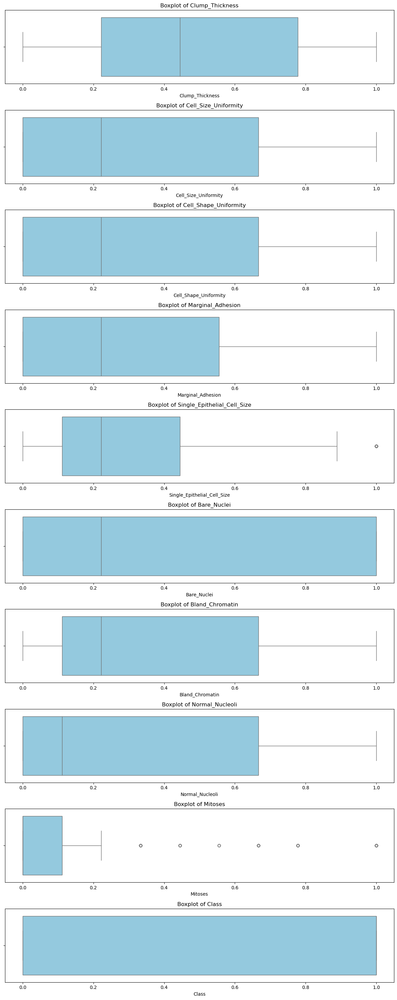

In [71]:
plt.figure(figsize=(12, len(df_n.columns) * 3))

for i, col in enumerate(df_n.columns, 1):
    plt.subplot(len(df_n.columns), 1, i)
    sns.boxplot(x=df_n[col], color='skyblue')
    plt.title(f'Boxplot of {col}', fontsize=12)
    plt.tight_layout()

plt.show()


In [79]:
features = df.columns[0:-1]
features


Index(['Clump_Thickness', 'Cell_Size_Uniformity', 'Cell_Shape_Uniformity',
       'Marginal_Adhesion', 'Single_Epithelial_Cell_Size', 'Bare_Nuclei',
       'Bland_Chromatin', 'Normal_Nucleoli', 'Mitoses'],
      dtype='object')

In [81]:
outcome = 'Class'

# X include all the features
X = df_n[features].copy()
# y is the target variable
y = df_n[outcome].copy()

In [83]:
X

,Clump_Thickness,Cell_Size_Uniformity,Cell_Shape_Uniformity,Marginal_Adhesion,Single_Epithelial_Cell_Size,Bare_Nuclei,Bland_Chromatin,Normal_Nucleoli,Mitoses
0,0.444444,0.000000,0.000000,0.000000,0.111111,0.000000,0.222222,0.000000,0.000000
1,0.444444,0.333333,0.333333,0.444444,0.666667,1.000000,0.222222,0.111111,0.000000
2,0.222222,0.000000,0.000000,0.000000,0.111111,0.111111,0.222222,0.000000,0.000000
3,0.555556,0.777778,0.777778,0.000000,0.222222,0.333333,0.222222,0.666667,0.000000
4,0.333333,0.000000,0.000000,0.222222,0.111111,0.000000,0.222222,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
444,0.222222,0.000000,0.000000,0.000000,0.111111,0.000000,0.111111,0.000000,0.111111
445,0.222222,0.000000,0.000000,0.000000,0.222222,0.111111,0.000000,0.000000,0.000000
446,0.444444,1.000000,1.000000,0.222222,0.666667,0.222222,0.777778,1.000000,0.111111
447,0.333333,0.777778,0.555556,0.333333,0.222222,0.333333,1.000000,0.555556,0.000000


In [96]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
Clump_Thickness,449.0,0.486513,0.318781,0.0,0.222222,0.444444,0.777778,1.0
Cell_Size_Uniformity,449.0,0.358080,0.361253,0.0,0.000000,0.222222,0.666667,1.0
Cell_Shape_Uniformity,449.0,0.363771,0.349055,0.0,0.000000,0.222222,0.666667,1.0
Marginal_Adhesion,449.0,0.305122,0.350935,0.0,0.000000,0.222222,0.555556,1.0
Single_Epithelial_Cell_Size,449.0,0.319970,0.272949,0.0,0.111111,0.222222,0.444444,1.0
Bare_Nuclei,449.0,0.422915,0.431168,0.0,0.000000,0.222222,1.000000,1.0
Bland_Chromatin,449.0,0.355605,0.294626,0.0,0.111111,0.222222,0.666667,1.0
Normal_Nucleoli,449.0,0.314279,0.376350,0.0,0.000000,0.111111,0.666667,1.0
Mitoses,449.0,0.101460,0.229879,0.0,0.000000,0.000000,0.111111,1.0


In [86]:
y

0      0
1      0
2      0
3      0
4      0
      ..
444    0
445    0
446    1
447    1
448    1
Name: Class, Length: 449, dtype: int8

In [88]:
y.value_counts()

Class
1    236
0    213
Name: count, dtype: int64

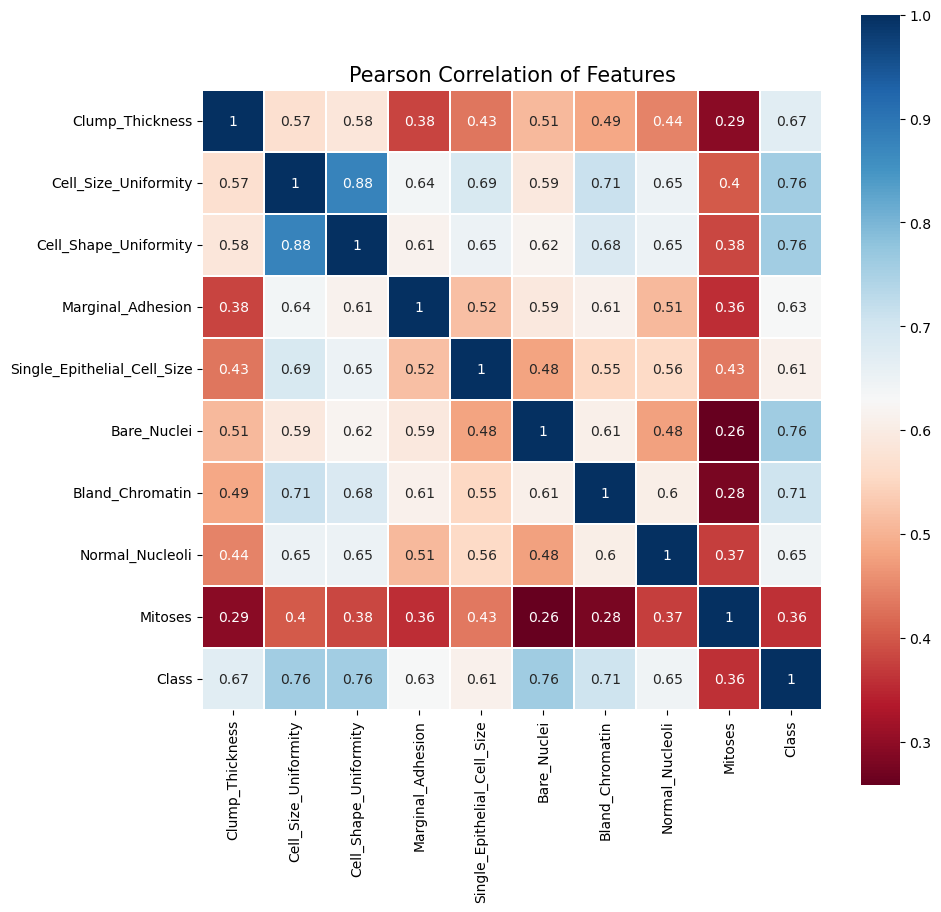

In [98]:
colormap = plt.cm.RdBu
plt.figure(figsize = (10, 10))
plt.title('Pearson Correlation of Features', size = 15)
sns.heatmap(df_n.astype(float).corr(),
            linewidths = 0.1,
            vmax = 1.0,
            square = True,
            cmap = colormap,
            linecolor = 'white',
            annot = True)
plt.show()

# Step 6: Modelling
Refer to the Problem and Main Question.
- What are the input variables (features)?
- Is there an output variable (label)?
- If there is an output variable:
    - What is it?
    - What is its type?
- What type of Modelling is it?
    - [ ] Supervised
    - [ ] Unsupervised
- What type of Modelling is it?
    - [ ] Regression
    - [ ] Classification (binary)
    - [ ] Classification (multi-class)
    - [ ] Clustering

Answer

- What are the input variables (features)? - Clump_Thickness, Uniformity_of_Cell_Size, Uniformity_of_Cell_Shape, Marginal_Adhesion, Single_Epithelial_Cell_Size, Bare_Nuclei, Bland_Chromatin, Normal_Nucleoli, Mitoses
- Is there an output variable (label)? - Yes
- If there is an output variable:
    - What is it? - Class
    - What is its type? - binary integer
- What type of Modelling is it? - Supervised
- What type of Modelling is it? -  Classification (binary)

# Step 7: Split the Data

Need to check for **Supervised** modelling:
- Number of known cases or observations
- Define the split in Training/Test or Training/Validation/Test and their proportions
- Check for unbalanced classes and how to keep or avoid it when splitting

In [110]:
df_n.shape

(449, 10)

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state = 10,
                                                    stratify = y)

# Step 8: Define and Fit Models

Define the model and its hyper-parameters.

Consider the parameters and hyper-parameters of each model at each (re)run and after checking the efficiency of a model against the training and test datasets.

In [137]:
# Base estimator: shallow trees to reduce variance and overfitting
base_tree = DecisionTreeClassifier(
    max_depth=3,              # Prevents overly complex trees
    min_samples_leaf=5,       # Ensures leaves have enough samples
    class_weight='balanced',  # Helps if your classes are imbalanced
    random_state=42
)

# Bagging ensemble
model = BaggingClassifier(
    estimator=base_tree,
    n_estimators=50,          # Fewer trees since the dataset is small
    max_samples=0.8,          # Use 80% of the data per tree (bootstrapped)
    bootstrap=True,           # Standard bagging
    random_state=42,
    n_jobs=-1                 # Use all CPU cores
)


# Step 9: Verify and Evaluate the Training Model
- Use the **training** data to make predictions
- What metrics are appropriate for the modelling approach used
- For **Supervised** models:
    - Check the **Training Results** with the **Training Predictions** during development
- Analyse, modify the parameters and hyper-parameters and repeat (within reason) until the model does not improve

In [139]:
model.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',
                                                   max_depth=3,
                                                   min_samples_leaf=5,
                                                   random_state=42),
                  max_samples=0.8, n_estimators=50, n_jobs=-1, random_state=42)

Training Accuracy: 0.9637883008356546
Training Precision: 0.9536082474226805
Training Recall: 0.9788359788359788
Training F1 Score: 0.9660574412532638
Training ROC AUC: 0.9945222533457827


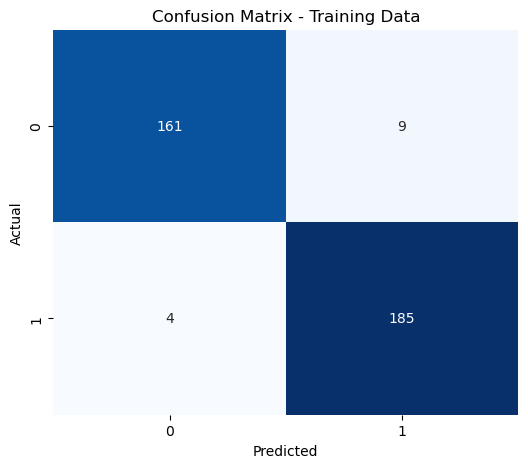

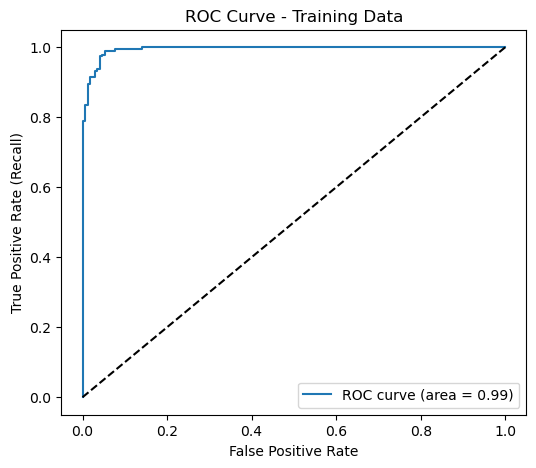

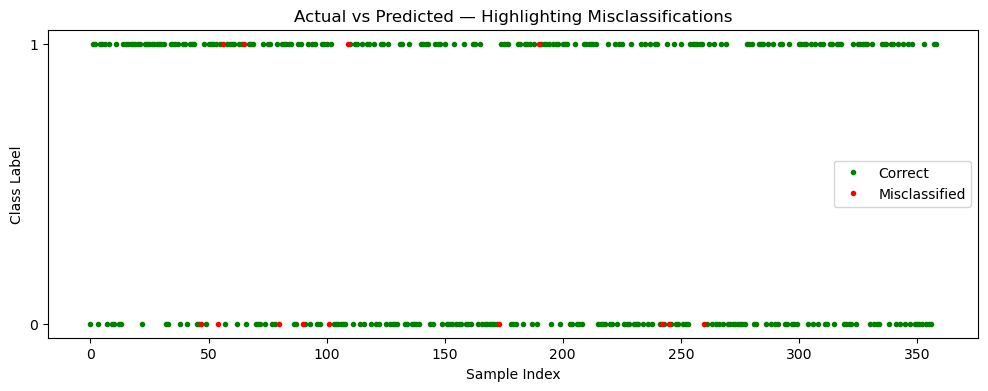

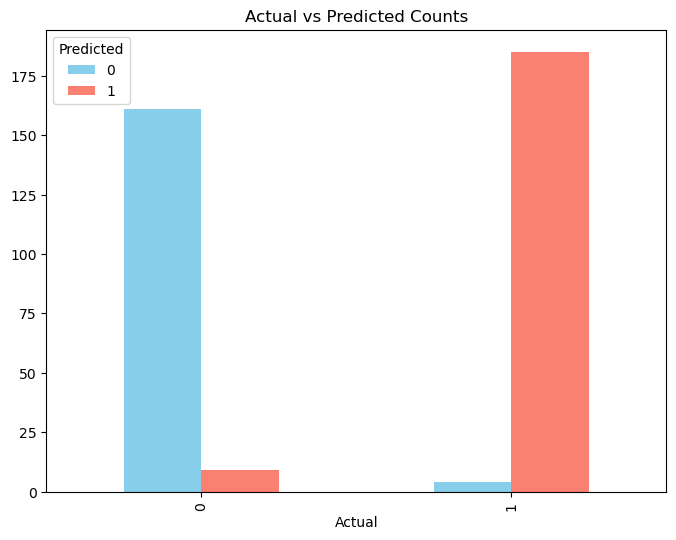

In [147]:
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1] 

print("Training Accuracy:", accuracy_score(y_train, y_train_pred))
print("Training Precision:", precision_score(y_train, y_train_pred,pos_label=1))
print("Training Recall:", recall_score(y_train, y_train_pred,pos_label=1))
print("Training F1 Score:", f1_score(y_train, y_train_pred,pos_label=1))
print("Training ROC AUC:", roc_auc_score(y_train, y_train_prob,))

cm = confusion_matrix(y_train, y_train_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Training Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

fpr, tpr, thresholds = roc_curve(y_train, y_train_prob,pos_label=1)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc_score(y_train, y_train_prob):.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve - Training Data')
plt.legend(loc='lower right')
plt.show()

misclassified = y_train != y_train_pred
plt.figure(figsize=(12,4))
plt.plot(np.where(~misclassified)[0], y_train[~misclassified], 'g.', label='Correct')
plt.plot(np.where(misclassified)[0], y_train[misclassified], 'r.', label='Misclassified')
plt.yticks([0,1])
plt.title("Actual vs Predicted — Highlighting Misclassifications")
plt.xlabel("Sample Index")
plt.ylabel("Class Label")
plt.legend()
plt.show()


df_compare = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred})

counts = pd.crosstab(df_compare['Actual'], df_compare['Predicted'], rownames=['Actual'], colnames=['Predicted'])

counts.plot(kind='bar', figsize=(8,6), color=['skyblue', 'salmon'])
plt.title("Actual vs Predicted Counts")
plt.show()

# Step 10: Make Predictions and Evaluate the Test Model
**NOTE**: **Do this only after not making any more improvements in the model**.

- Use the **test** data to make predictions
- For **Supervised** models:
    - Check the **Test Results** with the **Test Predictions**

Test Accuracy: 0.9555555555555556
Test Precision: 0.9387755102040817
Test Recall: 0.9787234042553191
Test F1 Score: 0.9583333333333334
Test ROC AUC: 0.9896091044037605


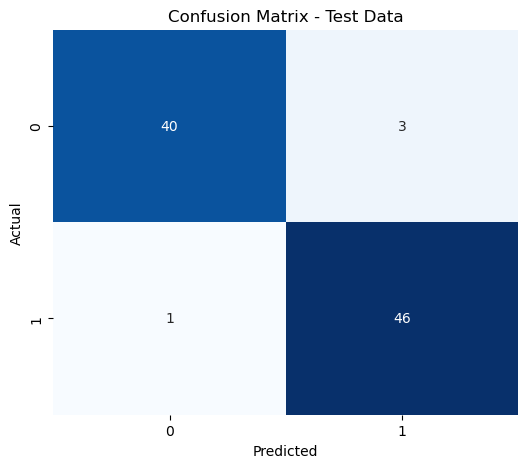

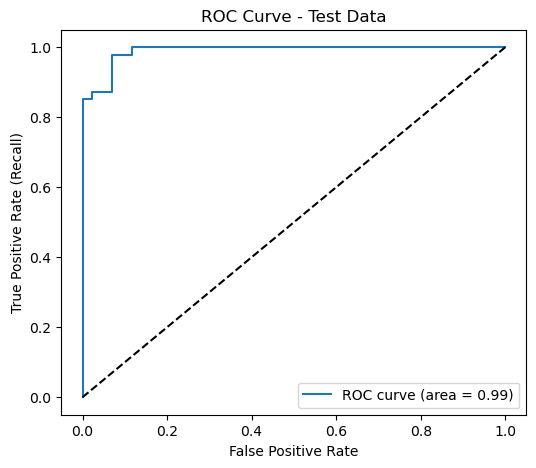

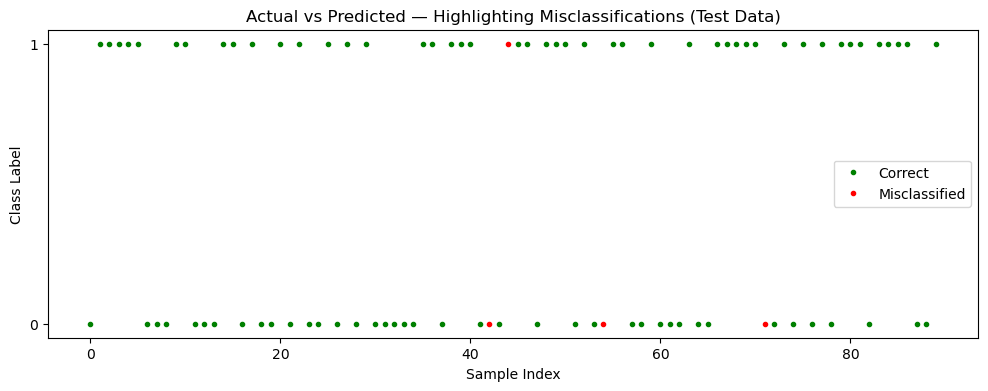

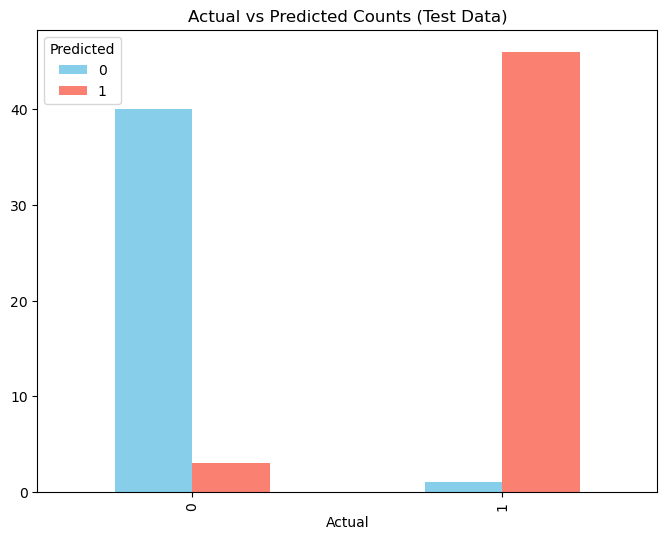

In [149]:
# 1. Predict on test data
y_test_pred = model.predict(X_test)
y_test_prob = model.predict_proba(X_test)[:, 1]  # Probabilities for positive class

# 2. Print metrics
print("Test Accuracy:", accuracy_score(y_test, y_test_pred))
print("Test Precision:", precision_score(y_test, y_test_pred, pos_label=1))
print("Test Recall:", recall_score(y_test, y_test_pred, pos_label=1))
print("Test F1 Score:", f1_score(y_test, y_test_pred, pos_label=1))
print("Test ROC AUC:", roc_auc_score(y_test, y_test_prob))

# 3. Confusion Matrix heatmap
cm = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Test Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 4. ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob, pos_label=1)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc_score(y_test, y_test_prob):.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve - Test Data')
plt.legend(loc='lower right')
plt.show()

# 5. Misclassification plot
misclassified = y_test != y_test_pred
plt.figure(figsize=(12,4))
plt.plot(np.where(~misclassified)[0], y_test[~misclassified], 'g.', label='Correct')
plt.plot(np.where(misclassified)[0], y_test[misclassified], 'r.', label='Misclassified')
plt.yticks([0,1])
plt.title("Actual vs Predicted — Highlighting Misclassifications (Test Data)")
plt.xlabel("Sample Index")
plt.ylabel("Class Label")
plt.legend()
plt.show()

# 6. Actual vs Predicted counts bar chart
df_compare = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred})
counts = pd.crosstab(df_compare['Actual'], df_compare['Predicted'], rownames=['Actual'], colnames=['Predicted'])
counts.plot(kind='bar', figsize=(8,6), color=['skyblue', 'salmon'])
plt.title("Actual vs Predicted Counts (Test Data)")
plt.show()


# Step 11: Solve the Problem or Answer the Question
The results of an analysis or modelling can be used:
- As part of a product or process, so the model can make predictions when new input data is available
- As part of a report including text and charts to help understand the problem
- As input for further questions

Answer:  
The model can predict if a person has benign or malignant cancer



---



---



> > > > > > > > > © 2025 Institute of Data


---



---



